# **Vehicle and Pedestrian Detection**

#### **Objectives:**
1. Use a Haarcascade classier to detect Pedestrians
2. Use our Haarcascade classifiers on videos
3. Use a Haarcascade classier to detect Vehicles or cars


> **Assets note.** The original asset pack for this course was never committed to this repo (no `images/`, `videos/`, or `haarcascades/`, in any past commit). This fork ships a real, working replacement set — sourced from OpenCV's own official sample data where a good match existed, generated procedurally where it didn't (see `scripts/generate_assets.py`) — under `assets/images/`, `assets/videos/`, and `assets/haarcascades/`, plus small, called-out fixes wherever a swap needed one. Nothing else was removed. See the README for the full source list. No download step needed — just run the cells top to bottom.

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define imshow function 
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

#### **Testing on a Single Frame from our Video**

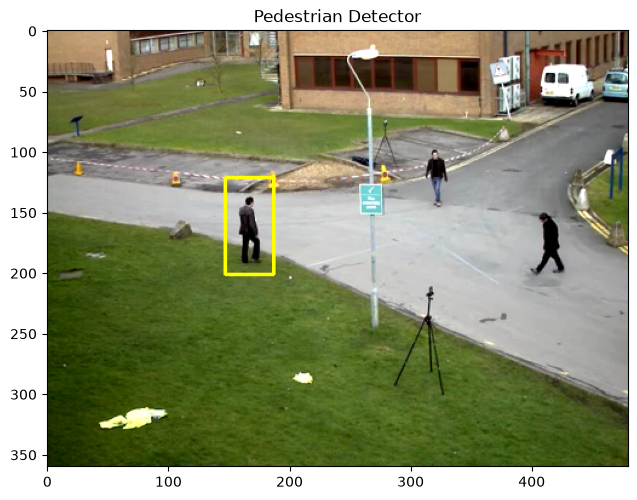

In [2]:
# Create our video capturing object
cap = cv2.VideoCapture('assets/videos/walking.mp4')

# Load our body classifier
body_classifier = cv2.CascadeClassifier('assets/haarcascades/Haarcascades/haarcascade_fullbody.xml')

# Read first frame
ret, frame = cap.read()

# Ret is True if successfully read
if ret: 

  #Grayscale our image for faster processing
  gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

  # Pass frame to our body classifier
  bodies = body_classifier.detectMultiScale(gray, 1.2, 3)

  # Extract bounding boxes for any bodies identified
  for (x,y,w,h) in bodies:
      cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)
  
# Release our video capture
cap.release()   
imshow("Pedestrian Detector", frame)

#### **Testing on a 15 second clip**

We use cv2.VideoWriter to save the output as an AVI file.

```cv2.VideoWriter(video_output.avi, cv2.VideoWriter_fourcc('M','J','P','G'), FPS, (width, height))```

Formats can be:
- 'M','J','P','G' or MJPG
- MP4V
- X264
- avc1
- XVID

In [3]:
# Create video capturing object
cap = cv2.VideoCapture('./assets/videos/walking.mp4')

# Get the height and width of the frame (required to be an interfer)
w = int(cap.get(3))
h = int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'walking_output.avi' file.
out = cv2.VideoWriter('walking_output.mp4', cv2.VideoWriter_fourcc('M','P','4','V'), 30, (w, h))

body_detector = cv2.CascadeClassifier('./assets/haarcascades/Haarcascades/haarcascade_fullbody.xml')

# Loop once video is successfully loaded
while(True):

  ret, frame = cap.read()
  if ret: 

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Pass frame to our body classifier
    bodies = body_detector.detectMultiScale(gray, 1.2, 3)

    # Extract bounding boxes for any bodies identified
    for (x,y,w,h) in bodies:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)
    
    # Write the frame into the file 'output.avi'
    out.write(frame)
  else:
      break

cap.release()
out.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


In [4]:
!ffmpeg -y -i walking_output.mp4 -c:v libx264 -pix_fmt yuv420p walking_output_h264.mp4 -loglevel error

Pedestrian (fullbody cascade) detections over the clip:


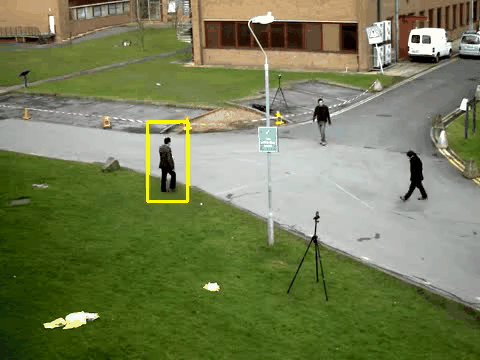

In [5]:
from nb_utils import embed_video, video_to_gif, show_gif

_gif = video_to_gif('walking_output_h264.mp4', 'walking_output.gif', fps=10, resize_width=480)
print('Pedestrian (fullbody cascade) detections over the clip:')
show_gif(_gif)      # renders inline everywhere, incl. a static GitHub preview
embed_video('walking_output_h264.mp4')  # a real, scrubbable player in a live notebook

## **Play Video within Notebooks**
Steps
1. Convert the MP4 file to AVI using FFMPEG
2. Load the HTML plugins in IPython
3. Display our HTML video player

In [6]:
!ffmpeg -i ./videos/walking.mp4 walking.avi -y

ffmpeg version 8.1.1 Copyright (c) 2000-2026 the FFmpeg developers
  built with Apple clang version 21.0.0 (clang-2100.0.123.102)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/8.1.1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gpl --enable-libsvtav1 --enable-libopus --enable-libx264 --enable-libmp3lame --enable-libdav1d --enable-libvmaf --enable-libvpx --enable-libx265 --enable-openssl --enable-videotoolbox --enable-audiotoolbox --enable-neon
  libavutil      60. 26.101 / 60. 26.101
  libavcodec     62. 28.101 / 62. 28.101
  libavformat    62. 12.101 / 62. 12.101
  libavdevice    62.  3.101 / 62.  3.101
  libavfilter    11. 14.101 / 11. 14.101
  libswscale      9.  5.101 /  9.  5.101
  libswresample   6.  3.101 /  6.  3.101
[in#0 @ 0x963020000] Error opening input: No such file or directory
Error opening input file ./videos/walking.mp4.
Error opening input files: No such file or directory


In [7]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('walking_output_h264.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [8]:
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % mp4)

#### **Vehicle Detection on Single Image**

### A note on vehicle detection

OpenCV doesn't ship an official, clearly-licensed `haarcascade_car.xml` the way it does for faces/eyes/pedestrians — the copies floating around tutorials online trace back to an old forum post with no formal license. Rather than depend on that, the two cells below detect moving cars with **background subtraction + contour bounding boxes** instead — no cascade file needed, and it generalizes to any vehicle shape rather than just the ones a cascade happened to be trained on.

`videos/cars.mp4` is a real highway clip (see the README for source/license) rather than a synthetic one, so unlike the single-car clips used for tracking later in this series, this scene has real multi-lane traffic — a nice stress test for the detector, since it should end up drawing a box around *each* moving car, not just one.

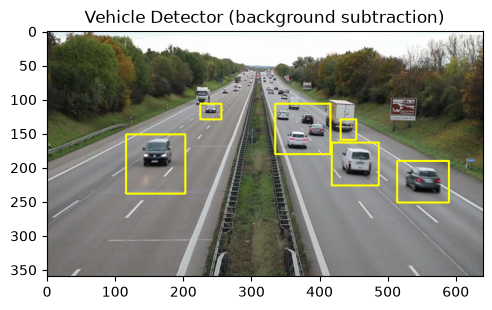

In [9]:
# Create video capturing object
cap = cv2.VideoCapture('./assets/videos/cars.mp4')

# Background-subtraction detector — see the note above on why this replaces
# a Haar cascade here. We warm it up on a few frames first so the moving car
# doesn't get absorbed into the 'background' model.
bg_subtractor = cv2.createBackgroundSubtractorMOG2(history=30, varThreshold=25, detectShadows=False)
frame = None
for _ in range(15):
    ret, frame = cap.read()
    if not ret:
        break
    fg_mask = bg_subtractor.apply(frame)

if frame is not None:
    # open() clears speckle noise, dilate() merges the resulting fragments
    # back into one solid blob per moving object before we measure area.
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
    fg_mask = cv2.dilate(fg_mask, np.ones((9,9), np.uint8), iterations=2)
    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for c in contours:
        if cv2.contourArea(c) > 400:
            x, y, w, h = cv2.boundingRect(c)
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)

# Release our video capture
cap.release()
imshow("Vehicle Detector (background subtraction)", frame)

#### **Testing on 15 second clip**

In [10]:
# Create video capturing object
cap = cv2.VideoCapture('./assets/videos/cars.mp4')

# Get the height and width of the frame (required to be an integer)
w = int(cap.get(3))
h = int(cap.get(4))

# Define the codec and create VideoWriter object. The output is stored in 'cars_output.mp4' file.
out = cv2.VideoWriter('cars_output.mp4', cv2.VideoWriter_fourcc('M','P','4','V'), 30, (w, h))

bg_subtractor = cv2.createBackgroundSubtractorMOG2(history=30, varThreshold=25, detectShadows=False)

# Loop once video is successfully loaded
while(True):

  ret, frame = cap.read()
  if ret:

    fg_mask = bg_subtractor.apply(frame)
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
    fg_mask = cv2.dilate(fg_mask, np.ones((9,9), np.uint8), iterations=2)
    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for c in contours:
        if cv2.contourArea(c) > 400:
            x, y, w2, h2 = cv2.boundingRect(c)
            cv2.rectangle(frame, (x, y), (x+w2, y+h2), (0, 255, 255), 2)

    # Write the frame into the file 'cars_output.mp4'
    out.write(frame)
  else:
      break

cap.release()
out.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


In [11]:
!ffmpeg -y -i cars_output.mp4 -c:v libx264 -pix_fmt yuv420p cars_output_h264.mp4 -loglevel error

In [12]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('cars_output_h264.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [13]:
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

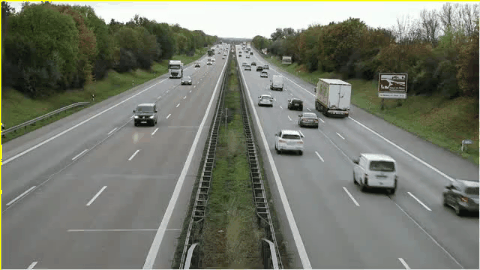

In [14]:
from nb_utils import video_to_gif, show_gif
show_gif(video_to_gif('cars_output_h264.mp4', 'cars_output.gif', fps=10, resize_width=480))

### One or two things to try next

- Combine both detectors: run pedestrian (Haar) and vehicle (background-subtraction) detection on the same scene and color-code the boxes by class.
- Track detections across frames (not just per-frame boxes) using centroid distance from one frame to the next — a lightweight preview of the tracking notebooks later in this series.